In [0]:
# The following blob storage is accessible to team members only (read and write)
# access key is valid til TTL
# after that you will need to create a new SAS key and authenticate access again via DataBrick command line
blob_container  = "final-project-summer24-team3"       # The name of your container created in https://portal.azure.com
storage_account = "summer2024team3"  # The name of your Storage account created in https://portal.azure.com
secret_scope    = "summer24_team_3_2_scope"           # The name of the scope created in your local computer using the Databricks CLI
secret_key      = "final-project-summer24-team3"             # The name of the secret key created in your local computer using the Databricks CLI
team_blob_url   = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"  #points to the root of your team storage bucket

# the 261 course blob storage is mounted here.
mids261_mount_path      = "/mnt/mids-w261"

# SAS Token: Grant the team limited access to Azure Storage resources
spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

# see what's in the blob storage root folder 
display(dbutils.fs.ls(f"{team_blob_url}"))

path,name,size,modificationTime
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/,TP/,0,1722707375000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/df_clean_transformed_ian/,df_clean_transformed_ian/,0,1722606719000


In [0]:
from pyspark.sql import SparkSession
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.mllib.evaluation import MulticlassMetrics
from pyspark.sql.functions import col, isnan, count, when, split, concat, lit, min, row_number, lower, lpad, udf, first, countDistinct, coalesce, to_timestamp, monotonically_increasing_id, explode, array, concat_ws, unix_timestamp
from pyspark.sql import functions as F
from pyspark.sql.types import IntegerType, FloatType, StructType, StructField, DoubleType
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import pandas as pd 
import warnings
from datetime import datetime, timedelta
warnings.filterwarnings("ignore")

In [0]:
merged_3m = spark.read.parquet("wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/flight_stations_weather_3m_cleaned2")
merged_all = spark.read.parquet("wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/flight_stations_weather_all_cleaned2")
downsampled_all = spark.read.parquet("wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/flight_stations_weather_all_cleaned3")
merged_all_train = merged_all.withColumn("YEAR", col("FL_DATE").substr(0, 4)).filter(col("YEAR").isin(["2015", "2016", "2017", "2018"]))
downsampled_train = downsampled_all.filter(col("YEAR").isin(["2015", "2016", "2017", "2018"]))

In [0]:
percentage_rain = merged_all_train.groupBy("Rain") \
                  .agg(
                      F.count("*").alias("total_count"),
                      F.sum("DEP_DEL15").alias("delay_count"),
                      (F.sum("DEP_DEL15") / F.count("*") * 100).alias("delay_percentage")
                  ).toPandas()
percentage_snow = merged_all_train.groupBy("Snow") \
                  .agg(
                      F.count("*").alias("total_count"),
                      F.sum("DEP_DEL15").alias("delay_count"),
                      (F.sum("DEP_DEL15") / F.count("*") * 100).alias("delay_percentage")
                  ).toPandas()

percentage_thunder = merged_all_train.groupBy("Thunder") \
                  .agg(
                      F.count("*").alias("total_count"),
                      F.sum("DEP_DEL15").alias("delay_count"),
                      (F.sum("DEP_DEL15") / F.count("*") * 100).alias("delay_percentage")
                  ).toPandas()
percentage_vo = merged_all_train.groupBy("View Obstruction") \
                  .agg(
                      F.count("*").alias("total_count"),
                      F.sum("DEP_DEL15").alias("delay_count"),
                      (F.sum("DEP_DEL15") / F.count("*") * 100).alias("delay_percentage")
                  ).toPandas()

In [0]:
df_rain = percentage_rain.copy()
df_rain.rename({"Rain": "Condition Observed"}, axis = 1, inplace = True)
df_rain["Weather Condition"] = "Rain"

df_snow = percentage_snow.copy()
df_snow.rename({"Snow": "Condition Observed"}, axis = 1, inplace = True)
df_snow["Weather Condition"] = "Snow"

df_thunder = percentage_thunder.copy()
df_thunder.rename({"Thunder": "Condition Observed"}, axis = 1, inplace = True)
df_thunder["Weather Condition"] = "Thunder"

df_vo = percentage_vo.copy()
df_vo.rename({"View Obstruction": "Condition Observed"}, axis = 1, inplace = True)
df_vo["Weather Condition"] = "View Obstruction"

df_weather = pd.concat([df_rain, df_snow, df_thunder, df_vo], axis = 0)


In [0]:
df_weather

,Condition Observed,total_count,delay_count,delay_percentage,Weather Condition
0,0,21743794,4039401.0,18.577259,Rain
1,1,2022774,576005.0,28.475994,Rain
0,0,23378483,4464939.0,19.098498,Snow
1,1,388085,150467.0,38.771661,Snow
0,0,23465725,4472765.0,19.060843,Thunder
1,1,300843,142641.0,47.413767,Thunder
0,0,21859847,4160627.0,19.033194,View Obstruction
1,1,1906721,454779.0,23.851366,View Obstruction


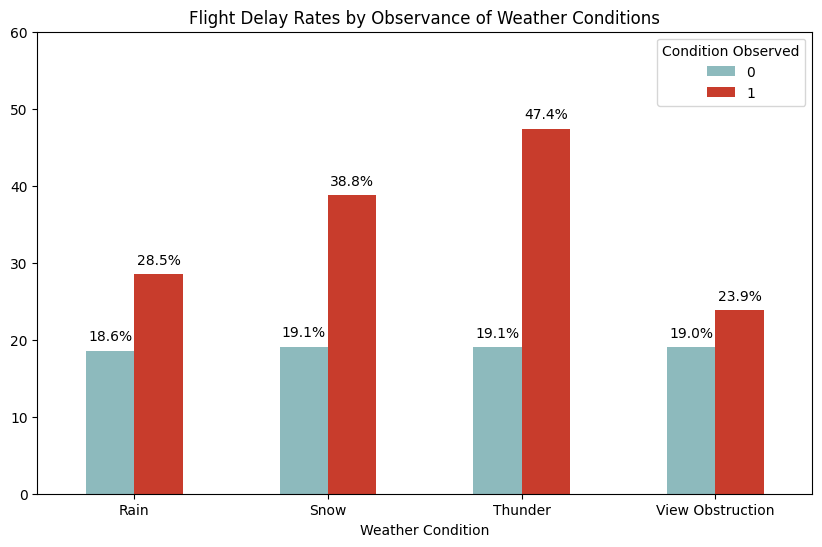

In [0]:
df_pivot = df_weather.pivot(index='Weather Condition', columns='Condition Observed', values='delay_percentage')

colors = ["#8dbabd", "#c83c2c"]
ax = df_pivot.plot(kind = "bar", figsize = (10, 6), color = colors)
ax.set_ylim(0,60)
ax.set_title("Flight Delay Rates by Observance of Weather Conditions")
plt.xticks(rotation = 0)
for p in ax.patches: 
    ax.annotate(f"{p.get_height():.1f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')


In [0]:
df_prev_delay = merged_all_train.groupBy("REALIZED_DEL15") \
                  .agg(
                      F.count("*").alias("total_count"),
                      F.sum("DEP_DEL15").alias("delay_count"),
                      (F.sum("DEP_DEL15") / F.count("*") * 100).alias("delay_percentage")
                  ).toPandas()

df_delay = df_prev_delay.copy()
df_delay.rename({"REALIZED_DEL15": "Previous Flight Delay Status"}, axis = 1, inplace = True)
df_delay["Previous Flight Delay Status"] = df_delay["Previous Flight Delay Status"].map({0: "Not Delay", 1: "Delayed"})

In [0]:
df_delay.sort_values("delay_percentage")

,Previous Flight Delay Status,total_count,delay_count,delay_percentage
1,Not Delay,20287937,3133268.0,15.443995
0,Delayed,3478631,1482138.0,42.606934


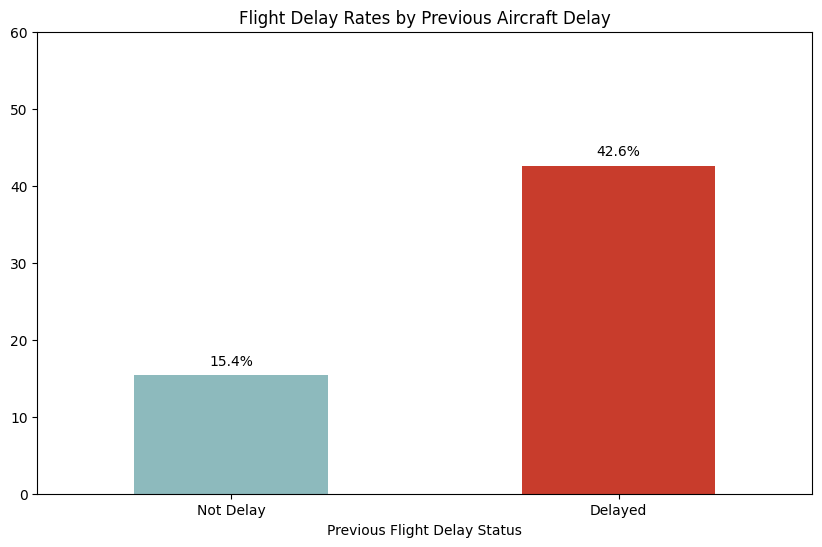

In [0]:
colors = ["#8dbabd", "#c83c2c"]
ax = df_delay.sort_values("delay_percentage").set_index("Previous Flight Delay Status")["delay_percentage"].plot(kind = "bar", figsize = (10, 6), color = colors)
ax.set_ylim(0,60)
ax.set_title("Flight Delay Rates by Previous Aircraft Delay")
plt.xticks(rotation = 0)
for p in ax.patches: 
    ax.annotate(f"{p.get_height():.1f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')


In [0]:
holidays = [# New Years
            "2015-01-01", "2016-01-01", "2017-01-01", "2018-01-01", "2019-01-01", "2020-01-01", "2021-01-01",
            # MLK Day 
            "2015-01-19", "2016-01-18", "2017-01-16", "2018-01-15", "2019-01-21", "2020-01-20", "2021-01-18",
            # President's Day
            "2015-02-16", "2016-02-15", "2017-02-20", "2018-02-19", "2019-02-18", "2020-02-17", "2021-02-15",
            # Memorial Day 
            # Juneteeth became holiday in 2021 (skip)
            # Independence Day 
            "2015-07-04", "2016-07-04", "2017-07-04", "2018-07-04", "2019-07-04", "2020-07-04", "2021-07-04",
            # Labor Day
            "2015-09-07", "2016-09-05", "2017-09-04", "2018-09-03", "2019-09-02", "2020-09-07", "2021-09-06",
            # Columbus Day 
            "2015-10-12", "2016-10-10", "2017-10-09", "2018-10-08", "2019-10-14", "2020-10-12", "2021-10-11", 
            # Veterans Day
            "2015-11-11", "2016-11-11", "2017-11-11", "2018-11-11", "2019-11-11", "2020-11-11", "2021-11-11",
            # Thanksgiving Day 
            "2015-11-26", "2016-11-24", "2017-11-23", "2018-11-22", "2019-11-28", "2020-11-26", "2021-11-25",
            # Christmas Day
            "2015-12-25", "2016-12-25", "2017-12-25", "2018-12-25", "2019-12-25", "2020-12-25", "2021-12-25"
            ]
# Convert to date 
holiday_dates = [datetime.strptime(date, "%Y-%m-%d") for date in holidays]
# Get all days within 3 days of a holiday date 
all_dates = []
for date in holiday_dates:
    start_date = date - timedelta(days=3)
    end_date = date + timedelta(days=3)
    current_date = start_date
    while current_date <= end_date:
        all_dates.append(current_date.strftime("%Y-%m-%d"))
        current_date += timedelta(days=1)

holiday_train = merged_all_train.withColumn("DATE", col("FL_DATE").cast("string").substr(0, 10)).withColumn("HOLIDAY", when(col("DATE").isin(all_dates), 1).otherwise(0)).drop("DATE")
df_holiday_delay = holiday_train.groupBy("HOLIDAY") \
                  .agg(
                      F.count("*").alias("total_count"),
                      F.sum("DEP_DEL15").alias("delay_count"),
                      (F.sum("DEP_DEL15") / F.count("*") * 100).alias("delay_percentage")
                  ).toPandas()

df_holiday = df_holiday_delay.copy()
df_holiday.rename({"HOLIDAY": "Federal Holiday (+/- 3 days)"}, axis = 1, inplace = True)
df_holiday["Federal Holiday (+/- 3 days)"] = df_holiday["Federal Holiday (+/- 3 days)"].map({0: "Not a Holiday", 1: "Holiday"})

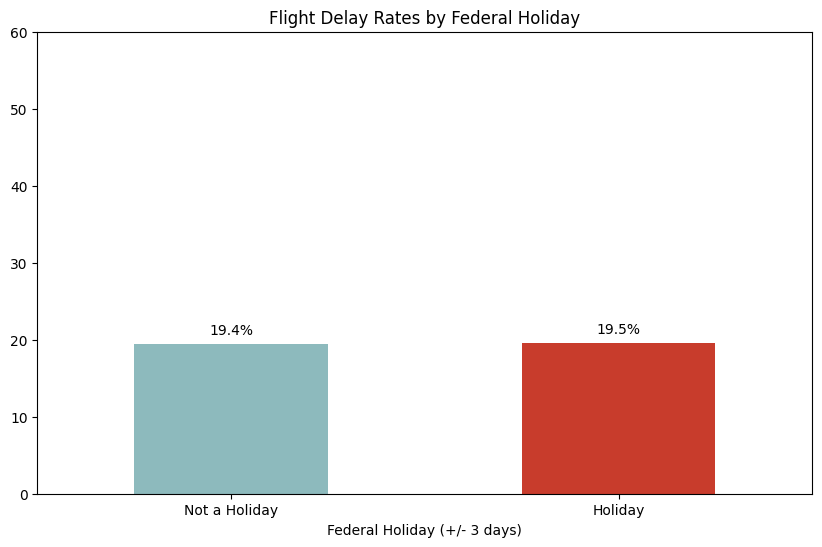

In [0]:
colors = ["#8dbabd", "#c83c2c"]
ax = df_holiday.sort_values("delay_percentage").set_index("Federal Holiday (+/- 3 days)")["delay_percentage"].plot(kind = "bar", figsize = (10, 6), color = colors)
ax.set_ylim(0,60)
ax.set_title("Flight Delay Rates by Federal Holiday")
plt.xticks(rotation = 0)
for p in ax.patches: 
    ax.annotate(f"{p.get_height():.1f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')


In [0]:
display(downsampled_train)

index,MONTH,DAY_OF_WEEK,OP_CARRIER,ORIGIN_AIRPORT_ID,CRS_DEP_TIME,DISTANCE,DEP_DEL15,QUARTER,DEP_DELAY,DEST_AIRPORT_ID,FL_DATE,TAIL_NUM,ARR_TIME,ARR_DELAY,ARR_DEL15,CANCELLED,type,ELEVATION,HourlyAltimeterSetting,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyVisibility,HourlyWindDirection,HourlyWindSpeed,HourlyPresentWeatherType,HOUR,MONTH_indexed,MONTH_vec,DAY_OF_WEEK_indexed,DAY_OF_WEEK_vec,OP_CARRIER_indexed,OP_CARRIER_vec,ORIGIN_AIRPORT_ID_indexed,ORIGIN_AIRPORT_ID_vec,HOUR_indexed,HOUR_vec,type_indexed,type_vec,HourlySkyConditions_vec,HourlyPresentWeatherType_vec,Rain,Snow,Thunder,Tornado,View Obstruction,MONTH_1,MONTH_2,MONTH_3,MONTH_4,MONTH_5,MONTH_6,MONTH_7,MONTH_8,MONTH_9,MONTH_10,MONTH_11,MONTH_12,HOUR_00,HOUR_01,HOUR_02,HOUR_03,HOUR_04,HOUR_05,HOUR_06,HOUR_07,HOUR_08,HOUR_09,HOUR_10,HOUR_11,HOUR_12,HOUR_13,HOUR_14,HOUR_15,HOUR_16,HOUR_17,HOUR_18,HOUR_19,HOUR_20,HOUR_21,HOUR_22,HOUR_23,DAY_OF_WEEK_1,DAY_OF_WEEK_2,DAY_OF_WEEK_3,DAY_OF_WEEK_4,DAY_OF_WEEK_5,DAY_OF_WEEK_6,DAY_OF_WEEK_7,OP_CARRIER_9E,OP_CARRIER_AA,OP_CARRIER_AS,OP_CARRIER_B6,OP_CARRIER_DL,OP_CARRIER_EV,OP_CARRIER_F9,OP_CARRIER_G4,OP_CARRIER_HA,OP_CARRIER_MQ,OP_CARRIER_NK,OP_CARRIER_OH,OP_CARRIER_OO,OP_CARRIER_QX,OP_CARRIER_UA,OP_CARRIER_US,OP_CARRIER_VX,OP_CARRIER_WN,OP_CARRIER_YV,OP_CARRIER_YX,type_large_airport,type_medium_airport,type_seaplane_base,type_small_airport,DEP_12hr,DEP_6hr,DEP_4hr,DISTANCE_LAG,REALIZED_DELAY_MIN,REALIZED_DEL15,HOLIDAY,OUTDEG_AIRPORT_6hr,YEAR
0,1,4,AS,14747,25,1448.0,0.0,1,-1.0,10299,2015-01-01,N527AS,259,-21.0,0.0,0.0,large_airport,0.0,0.0,0.0,0.0,0.0,null,0.0,0.0,0.0,0.0,null,00,6.0,"Map(vectorType -> sparse, length -> 11, indices -> List(6), values -> List(1.0))",2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",8.0,"Map(vectorType -> sparse, length -> 19, indices -> List(8), values -> List(1.0))",10.0,"Map(vectorType -> sparse, length -> 372, indices -> List(10), values -> List(1.0))",19.0,"Map(vectorType -> sparse, length -> 23, indices -> List(19), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",null,null,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.0,0.0,0.0,null,null,0,1,0.0,2015
1,1,4,DL,14771,25,1589.0,0.0,1,-5.0,13487,2015-01-01,N3730B,610,8.0,0.0,0.0,large_airport,0.0,0.0,0.0,0.0,0.0,null,0.0,0.0,0.0,0.0,null,00,6.0,"Map(vectorType -> sparse, length -> 11, indices -> List(6), values -> List(1.0))",2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 19, indices -> List(1), values -> List(1.0))",7.0,"Map(vectorType -> sparse, length -> 372, indices -> List(7), values -> List(1.0))",19.0,"Map(vectorType -> sparse, length -> 23, indices -> List(19), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",null,null,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.0,0.0,0.0,null,null,0,1,0.0,2015
2,1,4,US,12892,30,2125.0,0.0,1,14.0,11057,2015-01-01,N584UW,753,-10.0,0.0,0.0,large_airport,0.0,0.0,0.0,0.0,0.0,null,0.0,0.0,0.0,0.0,null,00,6.0,"Map(vectorType -> sparse, length -> 11, indices -> List(6), values -> List(1.0))",2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",17.0,"Map(vectorType -> sparse, length -> 19, indices -> List(17), values -> List(1.0))",4.0,"Map(vectorType -> sparse, length -> 372, indices -> List(4), values -> List(1.0))",19.0,"Map(vectorType -> sparse, length -> 23, indices -> List(19), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",null,null,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [0]:
outlink_delayed = downsampled_train.groupBy("DEP_DEL15").agg(
    F.mean("OUTDEG_AIRPORT_6hr").alias("Mean"),
    F.stddev("OUTDEG_AIRPORT_6hr").alias("STD")
)
display(outlink_delayed)

DEP_DEL15,Mean,STD
0.0,0.019665384066630508,0.022230625036138867
1.0,0.021016437159600162,0.018475254171858132


Text(0.5, 1.0, 'Airport Out Degree Distribution from 2-6 Hours Before Departure by Delay Status')

<Figure size 1000x600 with 0 Axes>

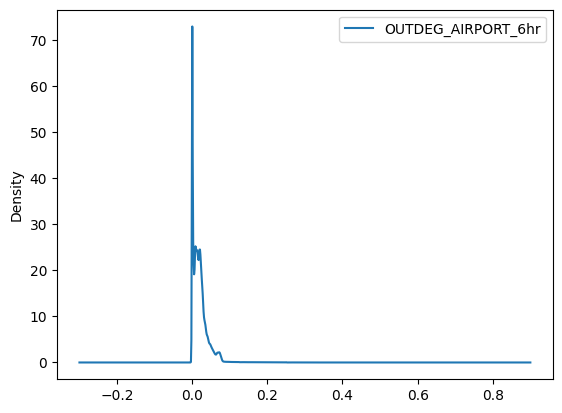

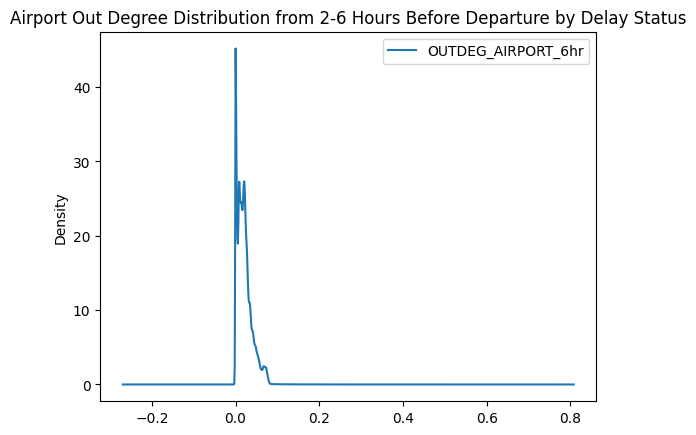

In [0]:
plt.figure(figsize = (10,6))
outlink_not_delayed.plot(kind = "density", label = "Not Delayed")
outlink_delayed.plot(kind = "density", label = "Delayed")

plt.title("Airport Out Degree Distribution from 2-6 Hours Before Departure by Delay Status")